In [0]:
!unzip colab

In [0]:
import tensorflow as tf
import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import pathlib
from skimage import io, color
import tensorflow as tf
from tqdm import tqdm

In [0]:
x_tr = tf.data.Dataset.list_files((str(pathlib.Path('idd20k_lite/leftImg8bit/train')/'*/*')),shuffle=False)

In [0]:
y_tr = tf.data.Dataset.list_files((str(pathlib.Path('idd20k_lite/gtFine/train')/'*/*_inst_label.png')),shuffle=False)

In [0]:
for f in x_tr.take(5):
    print(f.numpy())

b'idd20k_lite/leftImg8bit/train/0/024541_image.jpg'
b'idd20k_lite/leftImg8bit/train/0/024703_image.jpg'
b'idd20k_lite/leftImg8bit/train/1/092468_image.jpg'
b'idd20k_lite/leftImg8bit/train/1/340676_image.jpg'
b'idd20k_lite/leftImg8bit/train/1/502201_image.jpg'


In [0]:
for f in y_tr.take(5):
    print(f.numpy())

b'idd20k_lite/gtFine/train/0/024541_inst_label.png'
b'idd20k_lite/gtFine/train/0/024703_inst_label.png'
b'idd20k_lite/gtFine/train/1/092468_inst_label.png'
b'idd20k_lite/gtFine/train/1/340676_inst_label.png'
b'idd20k_lite/gtFine/train/1/502201_inst_label.png'


In [0]:
x_val = tf.data.Dataset.list_files((str(pathlib.Path('idd20k_lite/leftImg8bit/val')/'*/*')),shuffle=False)

In [0]:
y_val = tf.data.Dataset.list_files((str(pathlib.Path('idd20k_lite/gtFine/val')/'*/*_inst_label.png')),shuffle=False)

In [0]:
for f in x_val.take(5):
    print(f.numpy())

b'idd20k_lite/leftImg8bit/val/119/903127_image.jpg'
b'idd20k_lite/leftImg8bit/val/132/475092_image.jpg'
b'idd20k_lite/leftImg8bit/val/132/489315_image.jpg'
b'idd20k_lite/leftImg8bit/val/132/874777_image.jpg'
b'idd20k_lite/leftImg8bit/val/147/425716_image.jpg'


In [0]:
for f in y_val.take(5):
    print(f.numpy())

b'idd20k_lite/gtFine/val/119/903127_inst_label.png'
b'idd20k_lite/gtFine/val/132/475092_inst_label.png'
b'idd20k_lite/gtFine/val/132/489315_inst_label.png'
b'idd20k_lite/gtFine/val/132/874777_inst_label.png'
b'idd20k_lite/gtFine/val/147/425716_inst_label.png'


In [0]:
def process_path(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, [224, 224])
    return img

In [0]:
def segment(filename):
    def a1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,0]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def b1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,1]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def c1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,2]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def d1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,3]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def e1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,4]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def f1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,5]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def g1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,6]]), tf.constant([1],dtype=tf.dtypes.float32))
        return c
    def h1():
        c= tf.tensor_scatter_nd_update(b, tf.constant([[i,j,6]]), tf.constant([0],dtype=tf.dtypes.float32))
        return c
    img = tf.io.read_file(filename)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [224, 224])
    img = img[:, :, 0]
    img=tf.math.round(img)
    a=img
    b=tf.zeros([224,224,7], dtype=tf.dtypes.float32)
    for i in range(0,224):
        for j in range(0,224):
            b=tf.case([(tf.math.equal(a[i][j],0), a1), (tf.math.equal(a[i][j],1), b1),
                       (tf.math.equal(a[i][j],2), c1),(tf.math.equal(a[i][j],3), d1),
                      (tf.math.equal(a[i][j],4), e1), (tf.math.equal(a[i][j],5), f1),
                      (tf.math.equal(a[i][j],6), g1)],default=h1,exclusive=True)
    return b

In [0]:
x_tr_1=x_tr.map(process_path)
x_val_1=x_val.map(process_path)

In [0]:
y_tr_1=y_tr.map(segment)
y_val_1=y_val.map(segment)

In [0]:
train = tf.data.Dataset.zip((x_tr_1, y_tr_1))
val = tf.data.Dataset.zip((x_val_1, y_val_1))

In [0]:
train_dataset = train.cache().shuffle(500).batch(32)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = val.batch(32)

In [0]:
train_dataset

<PrefetchDataset shapes: ((None, 224, 224, 3), (None, 224, 224, 7)), types: (tf.float32, tf.float64)>

In [0]:
test_dataset

<BatchDataset shapes: ((None, 224, 224, 3), (None, 224, 224, 7)), types: (tf.float32, tf.float64)>

In [0]:
IMAGE_ORDERING = 'channels_last'
input_height=224
input_width=224
nClasses=7

In [0]:
class SegNetModel(tf.keras.Model):
	def __init__(self, classes,chanDim=-1):
		super(SegNetModel, self).__init__(name='my_model')
		#Encoder
		self.conv1 = layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING,input_shape=(224,224,3))
		self.bn1=layers.BatchNormalization()
		self.conv2 = layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn2=layers.BatchNormalization()
		self.pool1=layers.MaxPooling2D((2, 2), data_format = IMAGE_ORDERING)
		
		self.conv3 = layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn3=layers.BatchNormalization()
		self.conv4 = layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn4=layers.BatchNormalization()
		self.pool2=layers.MaxPooling2D((2, 2), data_format = IMAGE_ORDERING)
		
		self.conv5 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn5=layers.BatchNormalization()
		self.conv6 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn6=layers.BatchNormalization()
		self.conv7 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn7=layers.BatchNormalization()
		self.pool3=layers.MaxPooling2D((2, 2), data_format = IMAGE_ORDERING)
		
		self.conv8 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn8=layers.BatchNormalization()
		self.conv9 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn9=layers.BatchNormalization()
		self.conv10 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn10=layers.BatchNormalization()
		self.pool4=layers.MaxPooling2D((2, 2), data_format = IMAGE_ORDERING)
		
		self.conv11 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn11=layers.BatchNormalization()
		self.conv12 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn12=layers.BatchNormalization()
		self.conv13 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn13=layers.BatchNormalization()
		self.pool5=layers.MaxPooling2D((2, 2), data_format = IMAGE_ORDERING)
    
		#Decoder
		self.up1=layers.UpSampling2D()
		self.add0=layers.Add()
		self.conv14 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn14=layers.BatchNormalization()
		self.conv15 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn15=layers.BatchNormalization()
		self.conv16 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn16=layers.BatchNormalization()
		
		self.up2=layers.UpSampling2D()
		self.add1=layers.Add()
		self.conv17 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn17=layers.BatchNormalization()
		self.conv18 = layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn18=layers.BatchNormalization()
		self.conv19 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn19=layers.BatchNormalization()
		
		self.up3=layers.UpSampling2D()
		self.add2=layers.Add()
		self.conv20 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn20=layers.BatchNormalization()
		self.conv21 = layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn21=layers.BatchNormalization()
		self.conv22 = layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn22=layers.BatchNormalization()
		
		self.up4=layers.UpSampling2D()
		self.add3=layers.Add()
		self.conv23 = layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn23=layers.BatchNormalization()
		self.conv24 = layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn24=layers.BatchNormalization()
		
		self.up5=layers.UpSampling2D()
		self.add4=layers.Add() 
		self.conv25 = layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn25=layers.BatchNormalization()
		self.conv26 = layers.Conv2D(7, (1, 1), activation = 'relu', padding = 'same', data_format = IMAGE_ORDERING)
		self.bn26=layers.BatchNormalization()
		self.softmax=layers.Activation('softmax')

	def call(self, inputs):
		#Encoder
		x = self.conv1(inputs)
		x = self.bn1(x)
		x = self.conv2(x)
		a1=self.bn2(x)
		x=a1
		x=self.pool1(x)
  
		x=self.conv3(x)
		x=self.bn3(x)
		x=self.conv4(x)
		a2=self.bn4(x)
		x=a2
		x=self.pool2(x)
  
		x=self.conv5(x)
		x=self.bn5(x)
		x=self.conv6(x)
		x=self.bn6(x)
		x=self.conv7(x)
		a3=self.bn7(x)
		x=a3
		x=self.pool3(x)
  
		x=self.conv8(x)
		x=self.bn8(x)
		x=self.conv9(x)
		x=self.bn9(x)
		x=self.conv10(x)
		a4=self.bn10(x)
		x=a4
		x=self.pool4(x)
  
		x=self.conv11(x)
		x=self.bn11(x)
		x=self.conv12(x)
		x=self.bn12(x)
		x=self.conv13(x)
		aa=self.bn13(x)
		x=aa
		x=self.pool5(x)
  
		#Decoder
		aa1=self.up1(x)
		x=aa1
		x=self.add0([aa1,aa])
		x=self.conv14(x)
		x=self.bn14(x)
		x=self.conv15(x)
		x=self.bn15(x)
		x=self.conv16(x)
		x=self.bn16(x)
  
		a5=self.up2(x)
		x=a5
		x=self.add1([a5,a4])
		x=self.conv17(x)
		x=self.bn17(x)
		x=self.conv18(x)
		x=self.bn18(x)
		x=self.conv19(x)
		x=self.bn19(x)
  
		a6=self.up3(x)
		x=a6
		x=self.add2([a6,a3])
		x=self.conv20(x)
		x=self.bn20(x)
		x=self.conv21(x)
		x=self.bn21(x)
		x=self.conv22(x)
		x=self.bn22(x)
  
		a7=self.up4(x)
		x=a7
		x=self.add3([a7,a2])
		x=self.conv23(x)
		x=self.bn23(x)
		x=self.conv24(x)
		x=self.bn24(x)
  
		a8=self.up5(x)
		x=a8
		x=self.add4([a8,a1])
		x=self.conv25(x)
		x=self.bn25(x)
		x=self.conv26(x)
		x=self.bn26(x)
		x=self.softmax(x)

		return x

In [0]:
model=SegNetModel(classes=7)

In [0]:
#building model with input shape
model.build((32,224,224,3))

In [0]:
model.summary()

Model: "my_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           multiple                  1792      
_________________________________________________________________
batch_normalization_26 (Batc multiple                  256       
_________________________________________________________________
conv2d_27 (Conv2D)           multiple                  36928     
_________________________________________________________________
batch_normalization_27 (Batc multiple                  256       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 multiple                  0         
_________________________________________________________________
conv2d_28 (Conv2D)           multiple                  73856     
_________________________________________________________________
batch_normalization_28 (Batc multiple                  512

In [0]:
loss_object = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.9) # Defining Optimizer

In [0]:
@tf.function
def train_step(images,outputs,model,optimizer):
  with tf.GradientTape() as gen_tape: #Initializing gradient tape
    output_images=model(images,training=True) #Passing the images for training
    loss = loss_object(y_true=outputs,y_pred=output_images) #Defining loss and finding loss between actual output and predicted output
  gradients=gen_tape.gradient(loss,model.trainable_variables) #Finding gradients for all trainable variables in the model
  optimizer.apply_gradients(zip(gradients,model.trainable_variables)) #Applying gradient values for all trainable variables in the model
  return loss,gradients,output_images

In [0]:
epoch_loss_avg = tf.keras.metrics.Mean()
epoch_accuracy = tf.keras.metrics.MeanIoU(num_classes=7)

Here i am training the model just for few epochs to check if the checkpointing is working as expected or not.


I am using a new model_v1 and new optimizer_v1 for validating the checkpoint thing

In [0]:
model_v1=SegNetModel(classes=7)
optimizer_v1 = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.9)

In [0]:
#Creating Tensor Board logs location
test_log_dir = 'logs'
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
ckpt = tf.train.Checkpoint(optimizer=optimizer_v1, model=model_v1)
manager = tf.train.CheckpointManager(ckpt, './tf_ckpts20', max_to_keep=3)

In [0]:
optimizer_v1.iterations.numpy() #Checking the current step of optimizer_v1

0

In [0]:
#Training the model for 3 epochs
num_epochs=3
for epoch in range(num_epochs): #Looping for each epoch
	for image_batch in train_dataset: #For each loop, we are looping for each batch in the dataset
		loss,gradients,output_images=train_step(image_batch[0],image_batch[1],model=model_v1,optimizer=optimizer_v1)
		epoch_loss_avg.update_state(loss)
		epoch_accuracy.update_state(image_batch[1], output_images)
		with test_summary_writer.as_default():#Saves loss and metric after every batch
			tf.summary.scalar('Step_Loss', epoch_loss_avg.result(),step=optimizer_v1.iterations.numpy())
			tf.summary.scalar('Step_Miou', epoch_accuracy.result(),step=optimizer_v1.iterations.numpy())
		manager.save()
	with test_summary_writer.as_default():#Saves loss and metric after every epoch
		tf.summary.scalar('Epoch_Loss', epoch_loss_avg.result(),step=optimizer_v1.iterations.numpy()/44)
		tf.summary.scalar('Epoch_Miou', epoch_accuracy.result(),step=optimizer_v1.iterations.numpy()/44)
	print("Epoch {:03f}: Loss: {:.3f}, miou: {:.3f}".format(optimizer_v1.iterations.numpy()/44,epoch_loss_avg.result(),epoch_accuracy.result()))
	epoch_loss_avg.reset_states()
	epoch_accuracy.reset_states()

Epoch 1.000000: Loss: 1.945, miou: 0.429
Epoch 2.000000: Loss: 1.945, miou: 0.429
Epoch 3.000000: Loss: 1.945, miou: 0.429


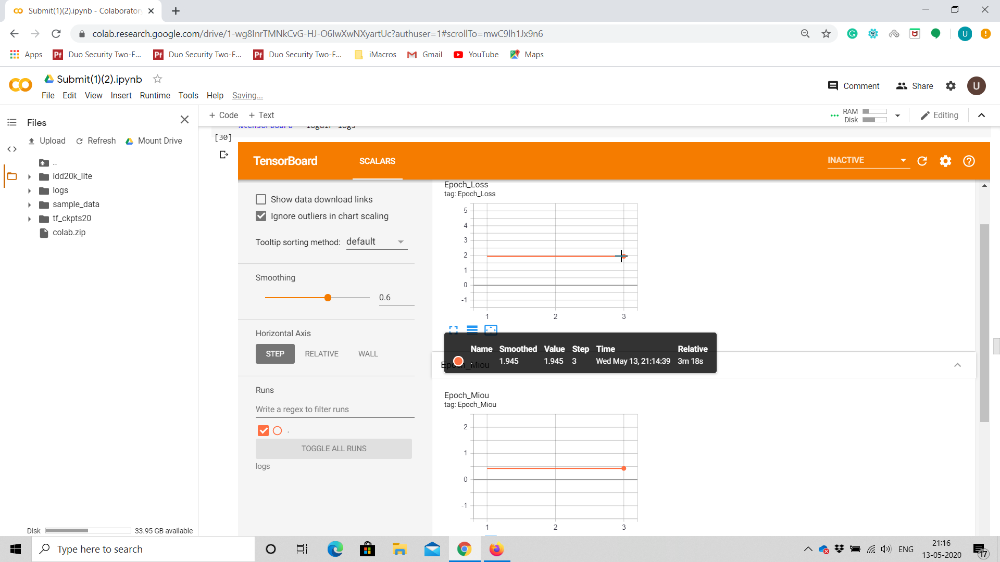

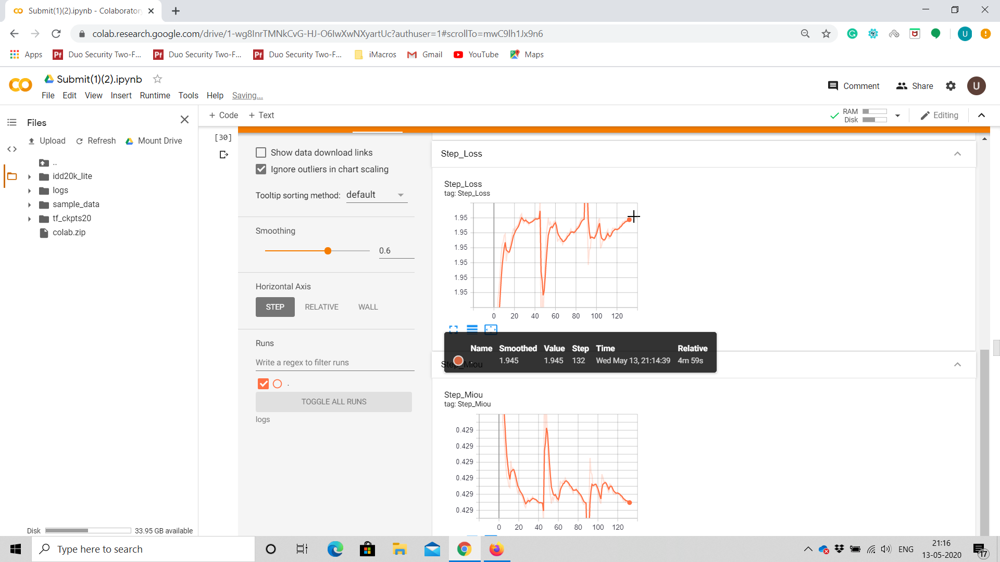

In [0]:
from IPython.display import display, Image
display(Image(filename='colab1.png'))
display(Image(filename='colab2.png'))

Now i am restoring the model_v1 as model_v2 and optimizer_v1 as optimizer_v2 and will resume training with model_v2 and optimizer_v2 to check if they all are synced

In [0]:
#Creating new model and optimizer
model_v2=SegNetModel(classes=7)
optimizer_v2 = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.9)

In [0]:
ckpt = tf.train.Checkpoint(optimizer=optimizer_v2, model=model_v2)

In [0]:
ckpt.restore(manager.latest_checkpoint)#Restoring the latest model and optimizer

In [0]:
optimizer_v2.iterations.numpy() #Cross checking if the restoring has taken place succesfully or not

132

Now i am training for 2 more epochs with model_v2 and optimizer_v2 to check the sync

In [0]:
#Training for the next 2 epochs
num_epochs=2
for epoch in range(num_epochs): #Looping for each epoch
	for image_batch in train_dataset: #For each loop, we are looping for each batch in the dataset
		loss,gradients,output_images=train_step(image_batch[0],image_batch[1],model=model_v2,optimizer=optimizer_v2)
		epoch_loss_avg.update_state(loss)
		epoch_accuracy.update_state(image_batch[1], output_images)
		with test_summary_writer.as_default():#Saves loss and metric after every batch
			tf.summary.scalar('Step_Loss', epoch_loss_avg.result(),step=optimizer_v2.iterations.numpy())
			tf.summary.scalar('Step_Miou', epoch_accuracy.result(),step=optimizer_v2.iterations.numpy())
		manager.save()
	with test_summary_writer.as_default():#Saves loss and metric after every epoch
		tf.summary.scalar('Epoch_Loss', epoch_loss_avg.result(),step=optimizer_v2.iterations.numpy()/44)
		tf.summary.scalar('Epoch_Miou', epoch_accuracy.result(),step=optimizer_v2.iterations.numpy()/44)
	print("Epoch {:03f}: Loss: {:.3f}, miou: {:.3f}".format(optimizer_v2.iterations.numpy()/44,epoch_loss_avg.result(),epoch_accuracy.result()))
	epoch_loss_avg.reset_states()
	epoch_accuracy.reset_states()

Epoch 4.000000: Loss: 1.945, miou: 0.429
Epoch 5.000000: Loss: 1.945, miou: 0.429


In [0]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

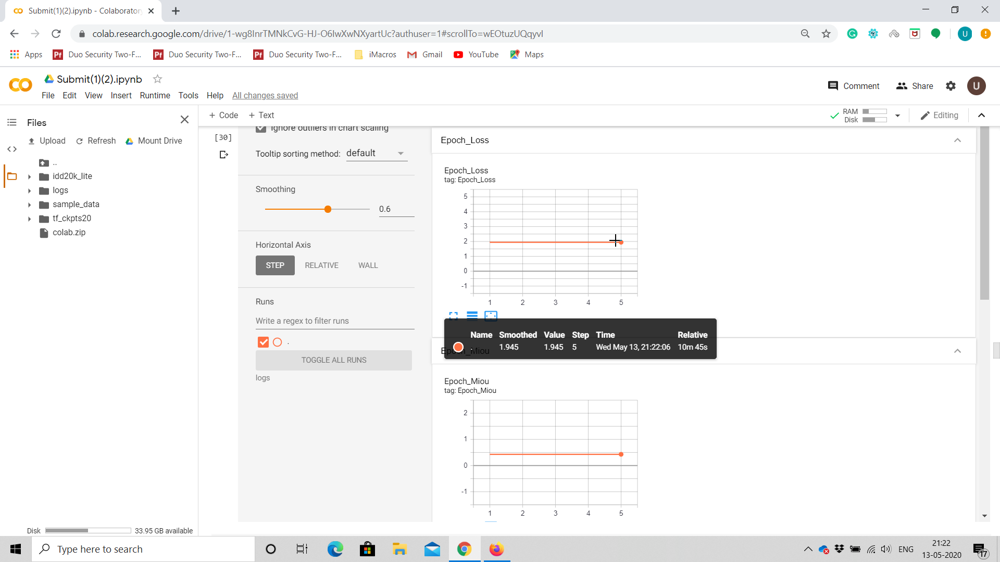

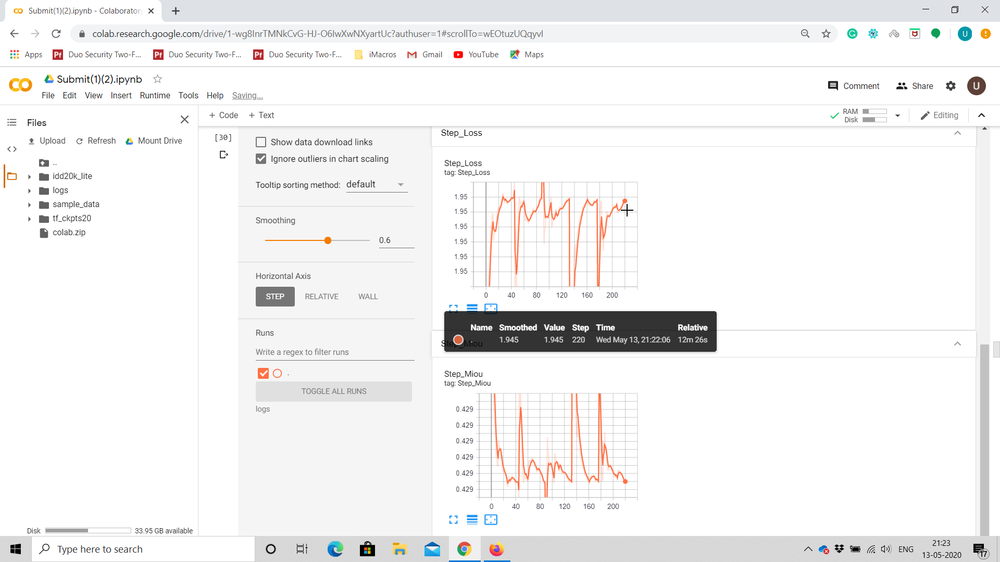

In [0]:
from IPython.display import display, Image
display(Image(filename='colab3.png'))
display(Image(filename='colab4.png'))

If the above logs are not visible please see the above attached images

We can see that the logging is working as expected and the results are getting continued

Now checkpointing is working good so we train the model for 100 epochs

In [0]:
#Creating new Tensor Board logs location
test_log_dir = 'logs20'
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
ckpt = tf.train.Checkpoint(optimizer=optimizer, model=model)
manager = tf.train.CheckpointManager(ckpt, './tf_ckpts20', max_to_keep=3)

In [0]:
%load_ext tensorboard
%tensorboard --logdir logs20

<IPython.core.display.Javascript object>

In [0]:
#Training model for 100 epochs
num_epochs=100
for epoch in range(num_epochs): #Looping for each epoch
	for image_batch in train_dataset: #For each loop, we are looping for each batch in the dataset
		loss,gradients,output_images=train_step(image_batch[0],image_batch[1],model=model,optimizer=optimizer)
		epoch_loss_avg.update_state(loss)
		epoch_accuracy.update_state(image_batch[1], output_images)
		with test_summary_writer.as_default():#Saves loss and metric after every batch
			tf.summary.scalar('Step_Loss', epoch_loss_avg.result(),step=optimizer.iterations.numpy())
			tf.summary.scalar('Step_Miou', epoch_accuracy.result(),step=optimizer.iterations.numpy())
		manager.save()
	with test_summary_writer.as_default():#Saves loss and metric after every epoch
		tf.summary.scalar('Epoch_Loss', epoch_loss_avg.result(),step=optimizer.iterations.numpy()/44)
		tf.summary.scalar('Epoch_Miou', epoch_accuracy.result(),step=optimizer.iterations.numpy()/44)
	print("Epoch {:03f}: Loss: {:.3f}, miou: {:.3f}".format(optimizer.iterations.numpy()/44,epoch_loss_avg.result(),epoch_accuracy.result()))
	epoch_loss_avg.reset_states()
	epoch_accuracy.reset_states()

Epoch 001: Loss: 1.291, miou: 0.681
Epoch 002: Loss: 1.275, miou: 0.746
Epoch 003: Loss: 1.270, miou: 0.779
Epoch 004: Loss: 1.266, miou: 0.797
Epoch 005: Loss: 1.263, miou: 0.812
Epoch 006: Loss: 1.261, miou: 0.821
Epoch 007: Loss: 1.260, miou: 0.828
Epoch 008: Loss: 1.258, miou: 0.833
Epoch 009: Loss: 1.256, miou: 0.840
Epoch 010: Loss: 1.253, miou: 0.845
Epoch 011: Loss: 1.252, miou: 0.851
Epoch 012: Loss: 1.250, miou: 0.855
Epoch 013: Loss: 1.249, miou: 0.858
Epoch 014: Loss: 1.247, miou: 0.862
Epoch 015: Loss: 1.247, miou: 0.865
Epoch 016: Loss: 1.245, miou: 0.870
Epoch 017: Loss: 1.244, miou: 0.870
Epoch 018: Loss: 1.243, miou: 0.873
Epoch 019: Loss: 1.243, miou: 0.875
Epoch 020: Loss: 1.242, miou: 0.877
Epoch 021: Loss: 1.241, miou: 0.879
Epoch 022: Loss: 1.240, miou: 0.881
Epoch 023: Loss: 1.239, miou: 0.883
Epoch 024: Loss: 1.238, miou: 0.885
Epoch 025: Loss: 1.238, miou: 0.887
Epoch 026: Loss: 1.237, miou: 0.889
Epoch 027: Loss: 1.237, miou: 0.891
Epoch 028: Loss: 1.236, miou

In [0]:
test_accuracy = tf.keras.metrics.MeanIoU(num_classes=7)

for batch in test_dataset:
  logits = model(batch[0], training=False)
  test_accuracy(batch[1], logits)
  loss = loss_object(y_true=batch[1],y_pred=logits)

print("Test set miou: {:.3f}".format(test_accuracy.result()))
print("Test set loss",loss.numpy())

Test set miou: 0.767
Test set loss 1.3643502


Getting Test MIOU as 76.7%


In [0]:
import numpy as np
# Assigning some RGB colors for the 7 + 1 (Misc) classes
colors = np.array([
    [255, 192, 203],      # Drivable
    [244, 35, 232],     # Non Drivable
    [220, 20, 60],      # Living Things
    [0, 0, 230],        # Vehicles
    [220, 190, 40],     # Road Side Objects
    [70, 70, 70],       # Far Objects
    [70, 130, 180],     # Sky
    [0, 0, 0]           # Misc
], dtype=np.int)


Now I am saving the final trained model to the disc

In [0]:
tf.keras.models.save_model(model=model,filepath='my_model')

Creating model1 so that we can plot the untrained model result

In [0]:
model1=SegNetModel(classes=7) #To plot untrained model output

Loading the saved trained model from the disc


In [0]:
model_restored=tf.keras.models.load_model(filepath='my_model')

In [0]:
def output(image_no):
  label_map=imread(label_paths_val[image_no])*255
  image_frame = imread(image_paths_val[image_no])
  color_image = np.zeros((label_map.shape[0], label_map.shape[1], 3), dtype=np.int)
  for i in range(7):
    color_image[label_map == i] = colors[i]
  color_image[label_map == 255] = colors[7]
  plt.imshow(image_frame)
  plt.imshow(color_image, alpha=0.8)
  print('Original masked image is')
  plt.show()

  a=model1(x_val[image_no:image_no+1],training=False)
  b = tf.argmax(a, axis=3)
  c=b[0,:,:]
  d=np.array(c,dtype='float32')
  image_frame = x_val[image_no]
  color_image = np.zeros((224, 224, 3), dtype=np.int)
  for i in range(7):
    color_image[d == i] = colors[i]
  #color_image[label_map == 255] = colors[7]
  plt.imshow(image_frame)
  plt.imshow(color_image, alpha=0.8)
  print('Untrained Model Output')
  plt.show()

  a=model_restored(x_val[image_no:image_no+1],training=False)
  b = tf.argmax(a, axis=3)
  c=b[0,:,:]
  d=np.array(c,dtype='float32')
  image_frame = x_val[image_no]
  color_image = np.zeros((224, 224, 3), dtype=np.int)
  for i in range(7):
    color_image[d == i] = colors[i]
  #color_image[label_map == 255] = colors[7]
  plt.imshow(image_frame)
  plt.imshow(color_image, alpha=0.8)
  print('Trained Model Output')
  plt.show()

Original masked image is


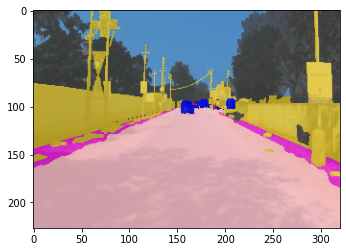

Untrained Model Output


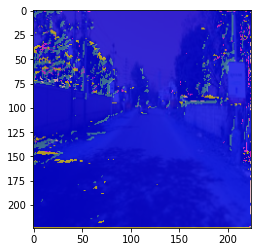

Trained Model Output


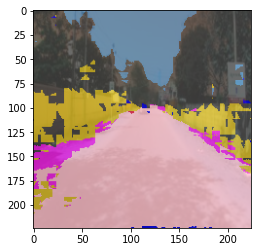

In [0]:
output(image_no=150)